In [1]:
# IMPORTS
import PyWGCNA
import pandas
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
# Load the dataset
geneExpression = '5xFAD_paper/expressionList.csv'
dataset = pandas.read_csv(geneExpression)

# Initialize the WGCNA with the dataset
pyWGCNA_5xFAD = PyWGCNA.WGCNA(name='5xFAD',
                              species='mus musculus',
                              geneExpPath=geneExpression,
                              outputPath='',
                              save=True,
                              networkType="unsigned",
                              powers = None)


Saving data to be True, checking requirements ...


Pre-processing...
	Detecting genes and samples with too many missing values...


	Done pre-processing..



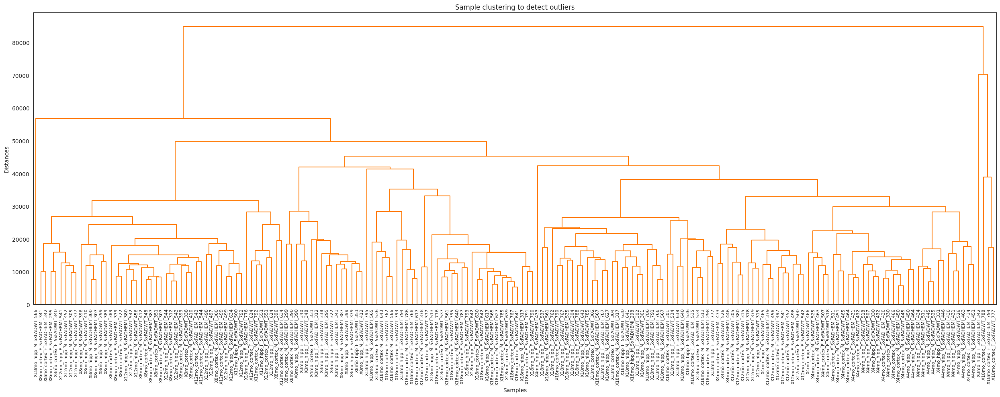

In [3]:
pyWGCNA_5xFAD.preprocess(show = True)

In [4]:
pyWGCNA_5xFAD.findModules()
# pyWGCNA_5xFAD.findModules(blockSize=1500, moreNetworkConcepts = True) # For some reason these don't work. Make the powerVector crash or block size goes into wrong functions

Run WGCNA...
pickSoftThreshold: calculating connectivity for given powers...
will use block size  1876


    Power  SFT.R.sq     slope truncated R.sq      mean(k)    median(k)  \
0       1  0.068792 -0.240657       0.280299  3652.578874  3800.852737   
1       2  0.568043 -0.915647        0.78568  1108.148182  1032.730792   
2       3  0.717702 -1.146349       0.938007   470.105021   367.188887   
3       4  0.793088 -1.323176       0.971082   240.275025   152.920968   
4       5  0.829789 -1.466143       0.977417   137.921458    69.632216   
5       6  0.862983 -1.567092       0.985283    85.696728     35.01005   
6       7   0.87901 -1.623685       0.988217    56.415672    18.594522   
7       8  0.893812 -1.655884       0.993785    38.821129     10.79537   
8       9  0.907304  -1.68106       0.996896    27.671719     6.852374   
9      10  0.910529 -1.707386         0.9978    20.302318     4.404117   
10     11  0.912421 -1.732006       0.997297    15.261356     2.900658   
11     13  0.915283 -1.758236       0.996929     9.155179     1.308141   
12     15  0.916354 -1.771983        0

In [ ]:
pyWGCNA_5xFAD.updateSampleInfo(path='/content/drive/MyDrive/MSc Bioinformatics/Year 2/Semester 2/Thesis/Work/WGCNA/5xFAD_paper/sampleInfo.csv', sep=',')

# add color for metadata
pyWGCNA_5xFAD.setMetadataColor('Sex', {'Female': 'green',
                                       'Male': 'yellow'})
pyWGCNA_5xFAD.setMetadataColor('Genotype', {'5xFADWT': 'darkviolet',
                                            '5xFADHEMI': 'deeppink'})
pyWGCNA_5xFAD.setMetadataColor('Age', {'4mon': 'thistle',
                                       '8mon': 'plum',
                                       '12mon': 'violet',
                                       '18mon': 'purple'})
pyWGCNA_5xFAD.setMetadataColor('Tissue', {'Hippocampus': 'red',
                                          'Cortex': 'blue'})

In [10]:
# Automatic dataset builder from biomart.
'''
geneList = PyWGCNA.getGeneList(dataset='mmusculus_gene_ensembl',
                               attributes=['ensembl_gene_id',
                                           'external_gene_name',
                                           'gene_biotype'],
                               maps=['gene_id', 'gene_name', 'gene_biotype'],
                               server_domain="http://ensembl.org/biomart")
'''

# We already have the file, so we just load it from the file
pyWGCNA_5xFAD.updateGeneInfo(path='/content/drive/MyDrive/MSc Bioinformatics/Year 2/Semester 2/Thesis/Work/WGCNA/5xFAD_paper/geneList', sep = ' ')


Some visualizations

In [12]:
pyWGCNA_5xFAD.datExpr

#pyWGCNA_5xFAD.datExpr.obs.head(5)

AnnData object with n_obs × n_vars = 192 × 8601
    obs: 'Age', 'Tissue', 'Sex', 'Genotype'
    var: 'dynamicColors', 'moduleColors', 'moduleLabels', 'gene_name', 'trancript_id'

In [11]:
np.max(pyWGCNA_5xFAD.adjacency)

0.9962458236761182

In [1]:
# Plotting the adjacency matrix as heatmap
plt.figure()
sns.heatmap(pyWGCNA_5xFAD.adjacency, cmap='hot')
plt.title("Heatmap of the adjacency matrix")
plt.show()


NameError: name 'plt' is not defined

Analysing WGCNA...
Calculating module trait relationship ...
	Done..

Adding (signed) eigengene-based connectivity (module membership) ...
	Done..

plotting module heatmap eigengene...
	Done..

plotting module barplot eigengene...
	Done..

doing Enrichr GO analysis for each module...
GO directory does not exist!
Creating GO directory!
	Done..



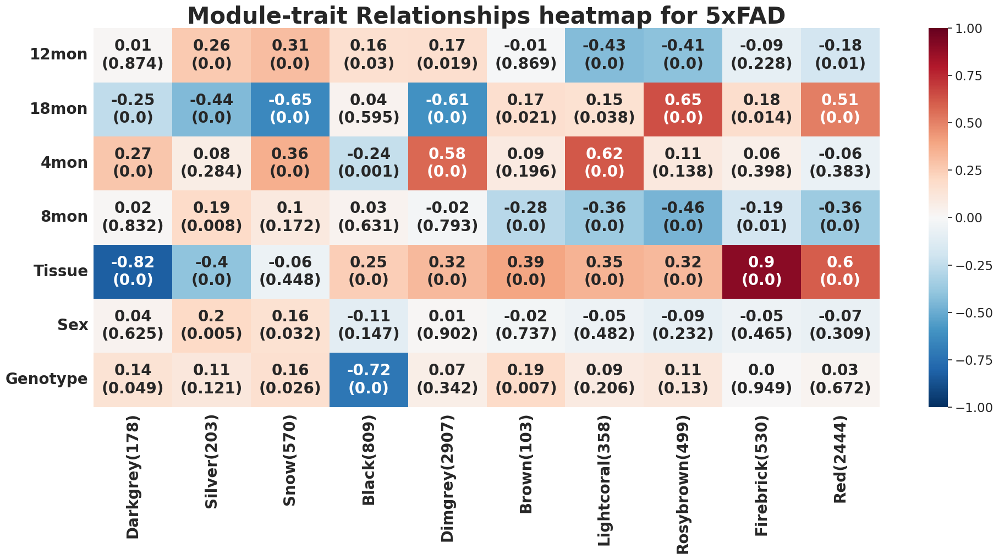

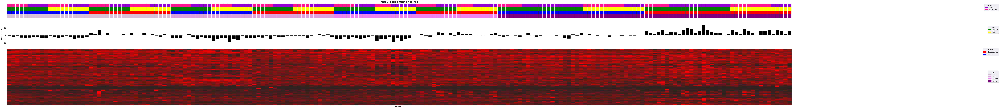

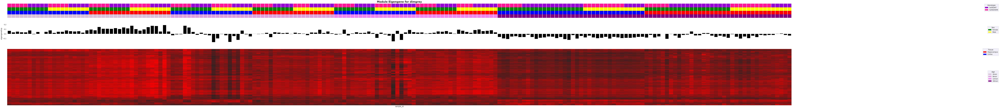

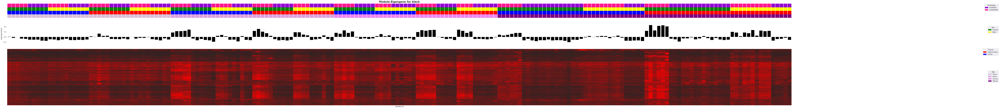

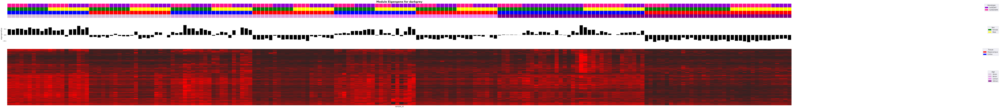

...

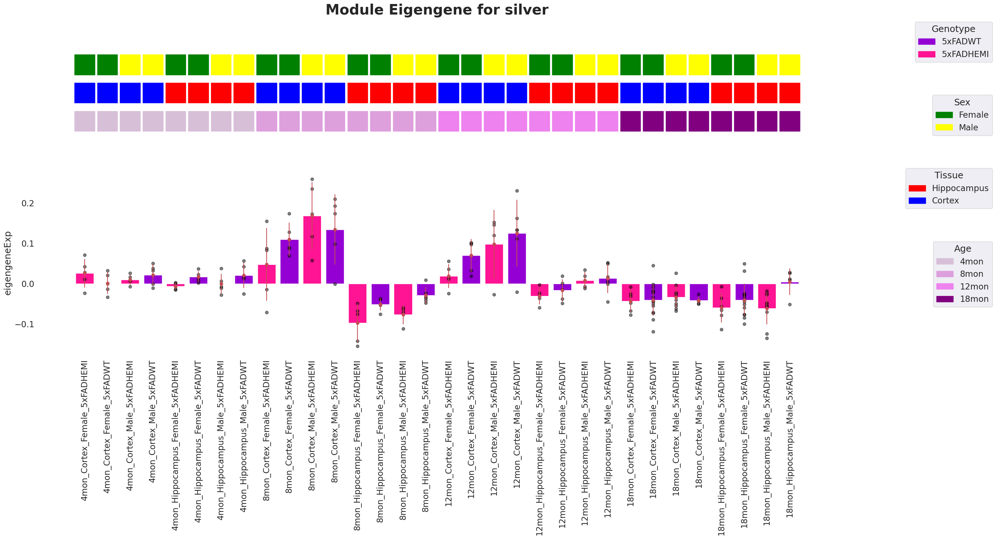

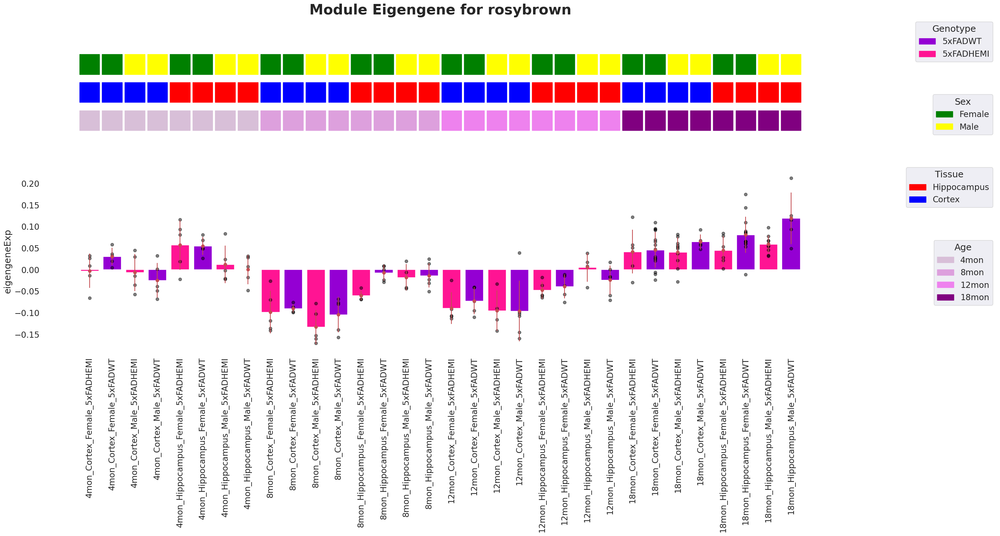

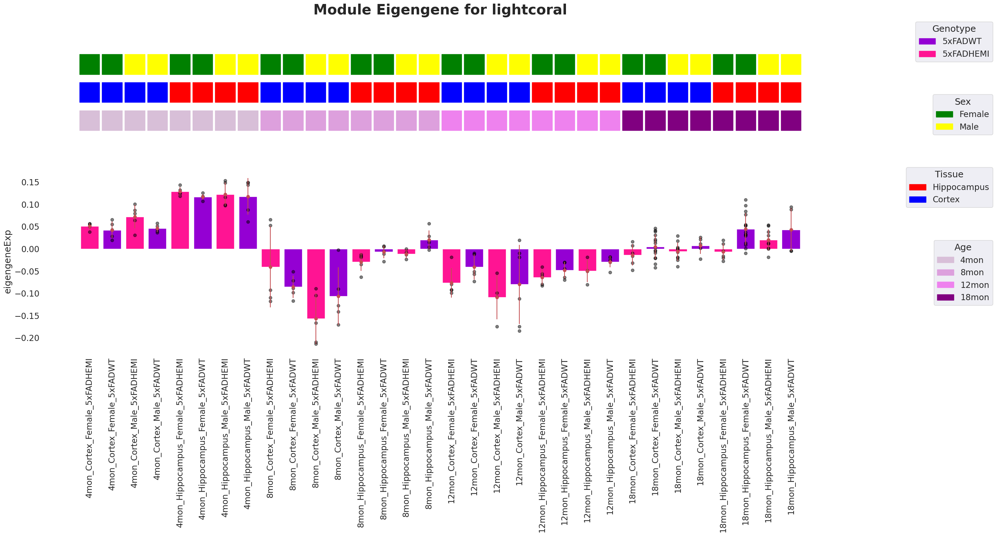

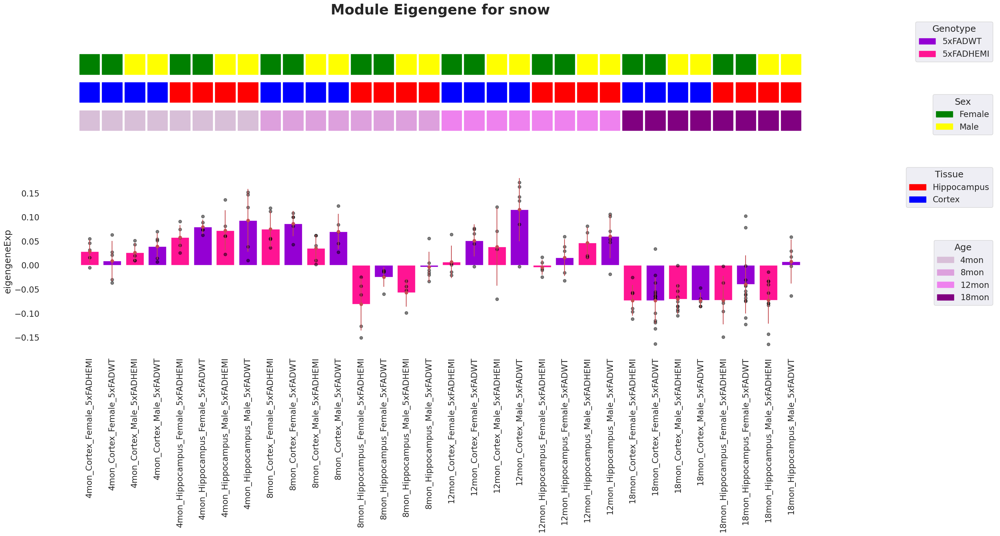

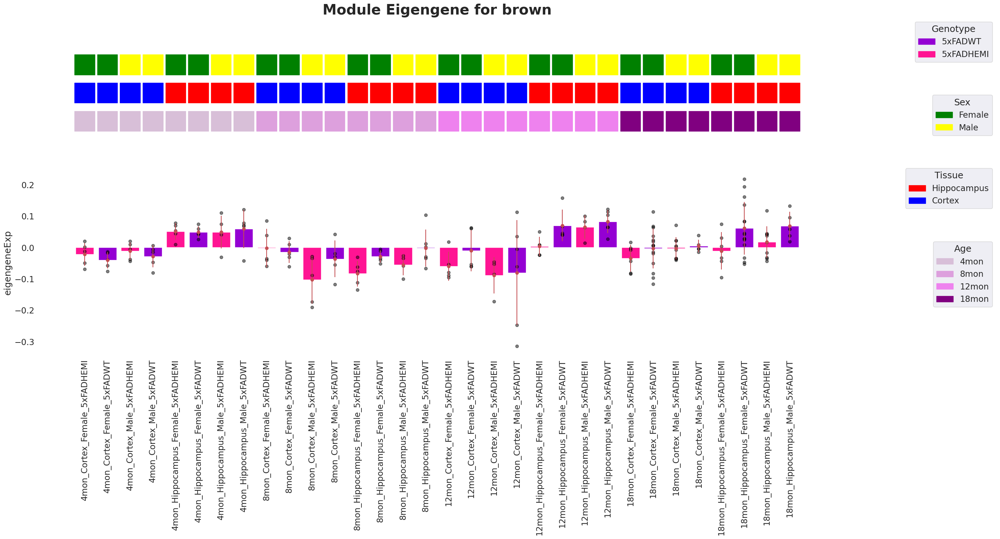

In [24]:
pyWGCNA_5xFAD.analyseWGCNA()

In [26]:
pyWGCNA_5xFAD.top_n_hub_genes(moduleName="brown", n=50)


calculating adjacency matrix ...
	Done..



,connectivity,dynamicColors,moduleColors,moduleLabels,gene_name,trancript_id
ENSMUSG00000020719,2.846401,brown,brown,1.0,Ddx5,ENSMUSG00000020719.14
ENSMUSG00000022682,2.341499,brown,brown,1.0,Rrn3,ENSMUSG00000022682.8
ENSMUSG00000032096,2.171394,brown,brown,1.0,Arcn1,ENSMUSG00000032096.16
ENSMUSG00000021427,2.152505,brown,brown,1.0,Ssr1,ENSMUSG00000021427.10
ENSMUSG00000026576,2.074509,brown,brown,1.0,Atp1b1,ENSMUSG00000026576.12
ENSMUSG00000022195,2.029078,brown,brown,1.0,6030458C11Rik,ENSMUSG00000022195.7
ENSMUSG00000015757,2.021048,brown,brown,1.0,Ppil4,ENSMUSG00000015757.10
ENSMUSG00000029422,2.013996,brown,brown,1.0,Rsrc2,ENSMUSG00000029422.15
ENSMUSG00000000600,1.926990,brown,brown,1.0,Krit1,ENSMUSG00000000600.15
ENSMUSG00000027201,1.863023,brown,brown,1.0,Myef2,ENSMUSG00000027201.16
